# Diagnostics

In this notebook, we are going to look at some simulations that we have available and analyze some of the statistical properties of the datasets. 

In [2]:
import sys, os
from pyprojroot import here

# spyder up to find the root
root = here(project_files=[".here"])

# append to path
sys.path.append(str(root))

In [3]:
import sys
import math

import torch
import torch.nn as nn

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

import xarray as xr
import hvplot.xarray
import powerspec as ps
import xrft
from dask.diagnostics import ProgressBar

from torchqg import to_spectral, to_physical, QgModel, MLdiv, Constant

import tqdm

from shapely.errors import ShapelyDeprecationWarning
from xmovie import Movie

import warnings
warnings.filterwarnings(
    action='ignore',
    category=ShapelyDeprecationWarning,  # in cartopy
)
warnings.filterwarnings(
    action="ignore",
    category=UserWarning,
    message=r"No `(vmin|vmax)` provided. Data limits are calculated from input. Depending on the input this can take long. Pass `\1` to avoid this step"
)

%load_ext autoreload
%autoreload 2
%matplotlib inline

device = cpu


In [4]:
data_path = str(root.joinpath("data"))

In [5]:
!ls $data_path

cutout_res.nc full_res.nc   hi_res.nc     lo_res.nc


In [6]:
# !ls /mnt/meom/workdir/johnsonj/data

save_path = root.joinpath("data/lo_res.nc")
# save_path = root.joinpath("temp.nc")

In [7]:
ds_grid = xr.open_zarr(save_path)
ds_grid

,Array,Chunk
Bytes,1.95 GiB,1.97 MiB
Shape,"(1000, 512, 512)","(63, 64, 64)"
Count,1025 Tasks,1024 Chunks
Type,float64,numpy.ndarray
,Array,Chunk
Bytes,1.95 GiB,1.97 MiB
Shape,"(1000, 512, 512)","(63, 64, 64)"
Count,1025 Tasks,1024 Chunks
Type,float64,numpy.ndarray
,Array,Chunk


### Preprocessing

* Slice time steps (due to the simulation warmup period)
* Rescale/Reformat time
* Add a dummy observation dataset (+ Gaussian noise)

In [8]:
def reformat_time(ds, dt):
    
    ds = ds - ds[0]
    ds /= dt
    
    return ds


def preprocessing(ds, noise: float=0.01, dt: float=1.0):
    
    # slice timesteps
    ds = ds.sel(steps=slice(500,1000))
    
    # reformat time
    time_coords = ds.steps.values.astype(np.float64)

    time_coords = reformat_time(
        time_coords, dt
    )
    time_coords = time_coords.astype(np.float64)
    ds["steps"] = time_coords
    
    # add noise to observations
    rng = np.random.RandomState(123)

    ds["q_obs"] = ds["q"] + noise * rng.randn(*ds["q"].shape)
    ds["p_obs"] = ds["p"] + noise * rng.randn(*ds["p"].shape)
    
    return ds

In [9]:
%%time

ds_grid = preprocessing(ds_grid)

CPU times: user 5.89 s, sys: 262 ms, total: 6.16 s
Wall time: 6.3 s


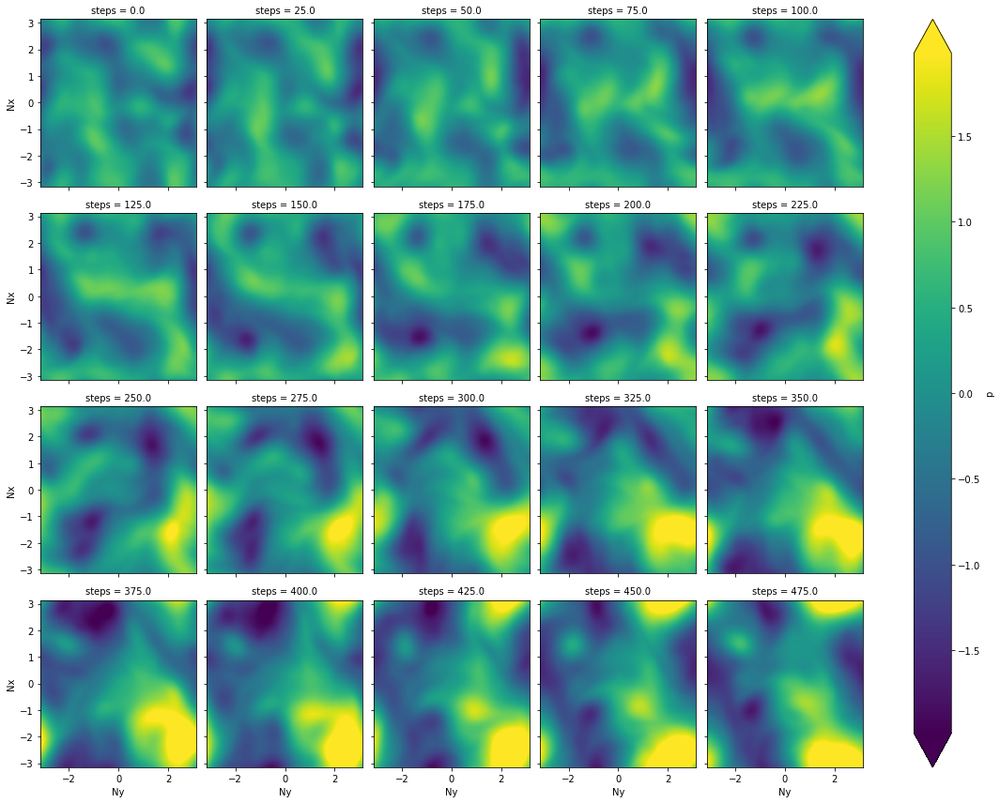

In [10]:
ds_grid.p.thin(steps=25).plot.imshow(
    col="steps", robust=True, col_wrap=5, cmap="viridis",
)


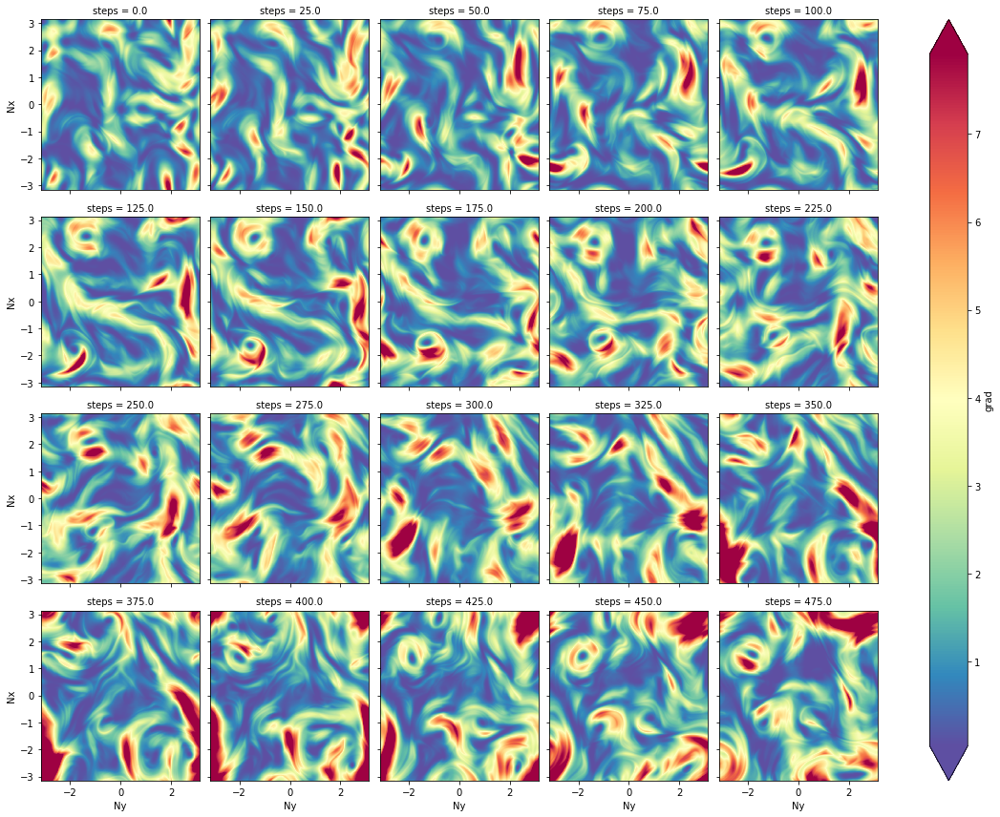

In [11]:
def gradient_norm(ds):
    return (
        ds.differentiate(coord="Nx", edge_order=1)**2 + 
        ds.differentiate(coord="Ny", edge_order=1)**2
    ).rename("grad")

ds_grid.p.pipe(gradient_norm).thin(steps=25).plot.imshow(
    col="steps", robust=True, col_wrap=5, cmap="Spectral_r",
)


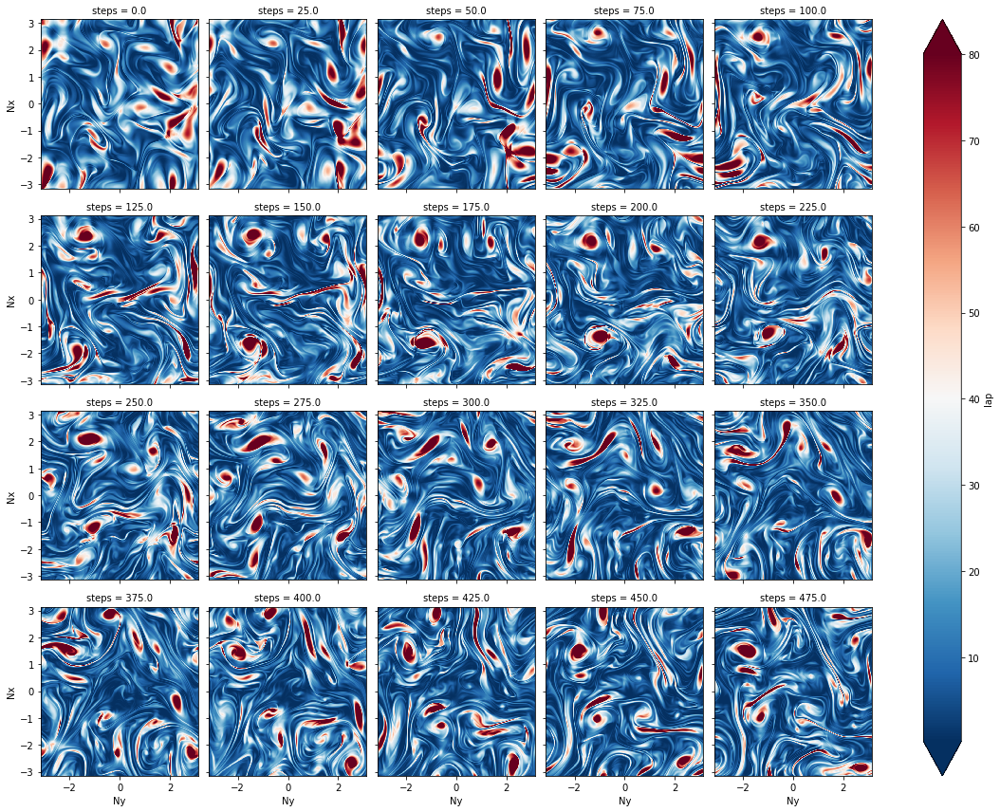

In [12]:
def laplacian_norm(ds):
    return (
        ds.differentiate(coord="Nx", edge_order=1).differentiate(coord="Nx", edge_order=1)**2 + 
        ds.differentiate(coord="Ny", edge_order=1).differentiate(coord="Ny", edge_order=1)**2
    ).rename("lap")

ds_grid.p.pipe(laplacian_norm).thin(steps=25).plot.imshow(
    col="steps", robust=True, col_wrap=5, cmap="RdBu_r"
)


In [13]:
# ds_grid.p_obs.hvplot.image(x="Nx", y="Ny", width=500, height=400, cmap="RdBu_r")

### PSD

In [14]:
def compute_psd(
    ds_truth,
    ds_preds,
    coords,
):
    Nx, Ny, Nz = coords[0], coords[1], coords[2]
    
    with ProgressBar():
        # compute error = SSH recon - SSH gt
        diff = ds_preds - ds_truth
        
        # rechunk differences
        diff = diff.chunk({Nx:1, Ny: diff[Ny].size, Nz: diff[Nz].size})
        
        # rechunk SSH truth
        signal = ds_truth.chunk({Nx:1, Ny: ds_truth[Ny].size, Nz: ds_truth[Nz].size})
        
        # Compute PSD_err and PSD_signal
        psd_diff = xrft.power_spectrum(diff, dim=[Ny, Nz], detrend='constant', window=True)
        psd_signal = xrft.power_spectrum(signal, dim=[Ny, Nz], detrend='constant', window=True)
        
        # average over Nx coord
        psd_diff = psd_diff.mean(dim=Nx).where((psd_diff[f"freq_{Ny}"] > 0.) & (psd_diff[f"freq_{Nz}"] > 0), drop=True).compute()
        psd_signal = psd_signal.mean(dim=Nx).where((psd_signal[f"freq_{Ny}"] > 0.) & (psd_signal[f"freq_{Nz}"] > 0), drop=True).compute()
        
        # save psd
        psd = xr.Dataset({
            "psd_diff": psd_diff,
            "psd_signal": psd_signal
        })
        
        # compute normalized psd score
        psd["psd_score"] = 1.0 - (psd_diff/psd_signal)
        
    return psd

In [15]:
psd_coords = ["Nx", "steps", "Ny"]
# psd_coords = ["Ny", "steps", "Nx"]

ds_psd = compute_psd(ds_grid.p, ds_grid.p_obs, psd_coords)

[                                        ] | 0% Completed |  0.0s

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(
/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


[########################################] | 100% Completed |  4.7s
[########################################] | 100% Completed |  3.8s


In [16]:
ds_psd.coords[f"freq_{psd_coords[-2]}"] = 1./ ds_psd[f"freq_{psd_coords[-2]}"]
ds_psd.coords[f"freq_{psd_coords[-1]}"] = 1./ds_psd[f"freq_{psd_coords[-1]}"]

In [17]:
ds_psd

<xarray.Dataset>
Dimensions:     (freq_steps: 249, freq_Ny: 255)
Coordinates:
  * freq_steps  (freq_steps) float64 500.0 250.0 166.7 ... 2.024 2.016 2.008
  * freq_Ny     (freq_Ny) float64 6.283 3.142 2.094 ... 0.02483 0.02474 0.02464
Data variables:
    psd_diff    (freq_steps, freq_Ny) float64 1.648e-07 1.558e-07 ... 1.673e-07
    psd_signal  (freq_steps, freq_Ny) float64 19.32 1.8 ... 2.026e-34 7.109e-34
    psd_score   (freq_steps, freq_Ny) float64 1.0 1.0 ... -8.409e+26 -2.353e+26

#### Plot (Interactive)

In [18]:
# ds_psd.hvplot.quadmesh(
#     x='freq_Nx', y='freq_steps', z='psd_signal', cmap='RdYlGn',
#     clim=(0, 1), 
#     logx=True, logy=True, title='PSD-score', width=500, height=400, 
#     clabel='PSD score', xlabel=f'Wavelength ({psd_coords[-1]})', ylabel='Wavelength (Steps)'
# )

#### Plot (Static)

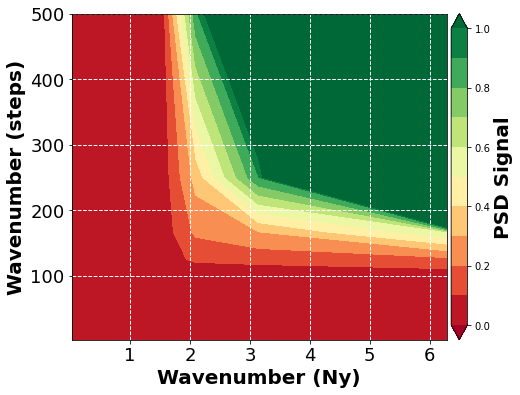

In [19]:
fig, ax = plt.subplots(figsize=(8, 6))

c1 = ax.contourf(
    ds_psd[f"freq_{psd_coords[-1]}"],
    ds_psd[f"freq_{psd_coords[-2]}"],
    ds_psd.psd_signal,
    levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, pad=0.01,)
cbar.set_label("PSD Signal", fontsize=20, fontweight="bold")
ax.set_xlabel(f'Wavenumber ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax.set_ylabel(f'Wavenumber ({psd_coords[-2]})', fontweight='bold', fontsize=20)
#plt.xscale('log')
#plt.yscale('log')
plt.grid(linestyle='--', lw=1, color='w')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

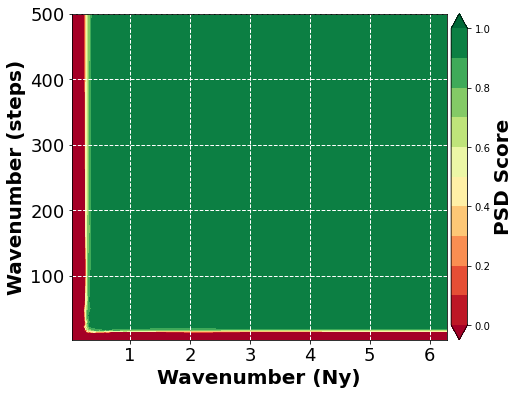

In [20]:
fig, ax = plt.subplots(figsize=(8, 6))

c1 = ax.contourf(
    ds_psd[f"freq_{psd_coords[-1]}"],
    ds_psd[f"freq_{psd_coords[-2]}"],
    ds_psd.psd_score,
    levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, pad=0.01)
cbar.set_label("PSD Score", fontsize=20, fontweight="bold")
ax.set_xlabel(f'Wavenumber ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax.set_ylabel(f'Wavenumber ({psd_coords[-2]})', fontweight='bold', fontsize=20)
#plt.xscale('log')
#plt.yscale('log')
plt.grid(linestyle='--', lw=1, color='w')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

### WaveNumber

In [26]:
# ds_grid.p.to_masked_array()[0].shape, ds_grid.Nx.data.shape, ds_grid.Ny.data.shape

((512, 512), (512,), (512,))

In [48]:
# from tqdm.notebook import trange
# psd_ = []

# for itime in trange(len(ds_grid.p)):
#     wavenumber, ipsd = ps.wavenumber_spectra(
#         ds_grid.p.to_masked_array()[itime], 
#         ds_grid.Nx.data, 
#         ds_grid.Ny.data
#     )
#     psd_.append(ipsd)
    


In [27]:
with ProgressBar():
    
    data = ds_grid.rename({"steps":"time"})
    
    data = data.chunk({'time':100 , "Nx": ds_grid.Nx.size, "Ny": ds_grid.Ny.size})
    
    u = xrft.isotropic_power_spectrum(
        data.u,
        dim=["Nx", "Ny"], detrend='linear', window=True
    ).compute()
    
    v = xrft.isotropic_power_spectrum(
        data.v,
        dim=["Nx", "Ny"], detrend='linear', window=True
    ).compute()
    
    ekeiso = 0.5 * (u**2 + v**2)

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


[######                                  ] | 16% Completed |  0.1s

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:1025: FutureWarning: Isotropic wavenumber larger than the Nyquist wavenumber may result.
  warnings.warn(msg, FutureWarning)


[########################################] | 100% Completed | 11.0s
[#######                                 ] | 18% Completed |  0.1s

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(
/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:1025: FutureWarning: Isotropic wavenumber larger than the Nyquist wavenumber may result.
  warnings.warn(msg, FutureWarning)


[########################################] | 100% Completed | 10.1s


In [28]:
ekeiso

<xarray.DataArray (time: 500, freq_r: 128)>
array([[2.86634455e-04, 4.95651340e-04, 1.47924122e-06, ...,
        2.43026205e-68, 3.12636258e-68, 6.48127970e-68],
       [2.90461969e-04, 5.01808419e-04, 1.51967082e-06, ...,
        2.20164452e-68, 3.67567668e-68, 2.92076224e-68],
       [2.94193067e-04, 5.07622080e-04, 1.56050859e-06, ...,
        1.27914188e-68, 5.56827845e-68, 5.33880014e-68],
       ...,
       [1.55225441e-03, 1.19302839e-04, 2.45322451e-06, ...,
        2.99960513e-68, 4.79344636e-68, 1.06106557e-67],
       [1.56128358e-03, 1.18835036e-04, 2.36757968e-06, ...,
        1.41084139e-68, 2.82007234e-68, 2.21589439e-67],
       [1.57059036e-03, 1.18377704e-04, 2.29295093e-06, ...,
        2.37070558e-68, 6.91413459e-68, 1.41919700e-67]])
Coordinates:
  * time     (time) float64 0.0 1.0 2.0 3.0 4.0 ... 496.0 497.0 498.0 499.0
  * freq_r   (freq_r) float64 0.2983 0.7002 1.14 1.588 ... 56.43 56.88 57.3

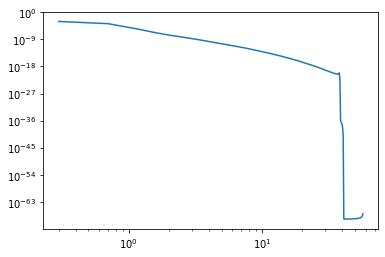

In [32]:
plt.plot(ekeiso.freq_r, ekeiso.mean("time").values)
plt.yscale("log")
plt.xscale("log")

### Powespec

In [170]:
psd_powerspec_res = {}

In [171]:
from tqdm.notebook import trange

NX, NY = np.meshgrid(ds_grid.p.Nx, ds_grid.p.Ny)
data = ds_grid.p

# - compute hourly spectral then estimate the mean
_psd = [] 
for k in trange(len(data)):
    wavenumber,ipsd = ps.wavenumber_spectra(
        data[k].to_masked_array().squeeze(),
        NX,
        NY
    )
    _psd.append(ipsd) 
    
psd_powerspec_res["psd"] = np.array(_psd)
psd_powerspec_res["wavenumber"] = wavenumber

  0%|          | 0/500 [00:00<?, ?it/s]

In [172]:
psd_powerspec_res["psd_mean"] = psd_powerspec_res["psd"].mean(0)

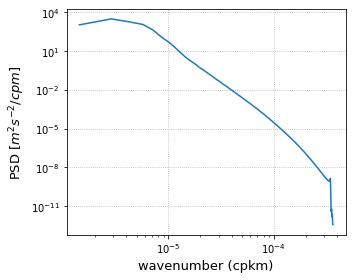

In [174]:
plt.figure(figsize=(5,4))
plt.loglog(
    psd_powerspec_res["wavenumber"] ,#1E3,
    psd_powerspec_res["psd_mean"]
)
plt.xlabel('wavenumber (cpkm)',fontsize=13)
plt.ylabel('PSD '+r'[$m^{2}s^{-2}/cpm$]',fontsize=13)
plt.grid(ls='dotted')
plt.tight_layout()

## Dataset - Extended Lo Res

In [154]:
save_path = root.joinpath("data/full_res.nc")

In [155]:
ds_grid_ext = xr.open_zarr(save_path)

In [156]:
%%time
ds_grid_ext = ds_grid_ext.isel(
    # steps=slice(500,1000),
    Nx=slice(256,1024-256),
    Ny=slice(256,1024-256)
).compute()

CPU times: user 8.13 s, sys: 7.75 s, total: 15.9 s
Wall time: 33.3 s


In [157]:
%%time
ds_grid_ext = preprocessing(ds_grid_ext)
ds_grid_ext

CPU times: user 4.22 s, sys: 1.27 s, total: 5.49 s
Wall time: 7.85 s


<xarray.Dataset>
Dimensions:  (Nx: 512, Ny: 512, steps: 500)
Coordinates:
  * Nx       (Nx) float64 -3.142 -3.129 -3.117 -3.105 ... 3.105 3.117 3.129
  * Ny       (Ny) float64 -3.142 -3.129 -3.117 -3.105 ... 3.105 3.117 3.129
  * steps    (steps) float64 0.0 1.0 2.0 3.0 4.0 ... 496.0 497.0 498.0 499.0
Data variables:
    p        (steps, Nx, Ny) float64 -0.9737 -0.972 -0.969 ... -0.379 -0.3717
    q        (steps, Nx, Ny) float64 7.771 7.604 7.448 ... -7.913 -7.912 -7.869
    u        (steps, Nx, Ny) float64 1.256 1.245 1.232 ... 0.7007 0.7039 0.7063
    v        (steps, Nx, Ny) float64 0.09456 0.1906 0.2849 ... 0.6022 0.5833
    q_obs    (steps, Nx, Ny) float64 7.761 7.614 7.45 ... -7.92 -7.92 -7.865
    p_obs    (steps, Nx, Ny) float64 -0.9861 -0.9636 -0.9742 ... -0.3823 -0.3754
Attributes: (12/16)
    B:          0.0
    dt:         0.0004
    forcing:    wind_stress
    iters:      10000
    mu:         0.020053522829578813
    nu:         0.00016412040576263483
    ...         ...
    sgs:        constant
    step_size:  0.01227184630308513
    steps:      1000
    t0:         0.0
    x_minmax:   12.566370614359172
    y_minmax:   12.566370614359172

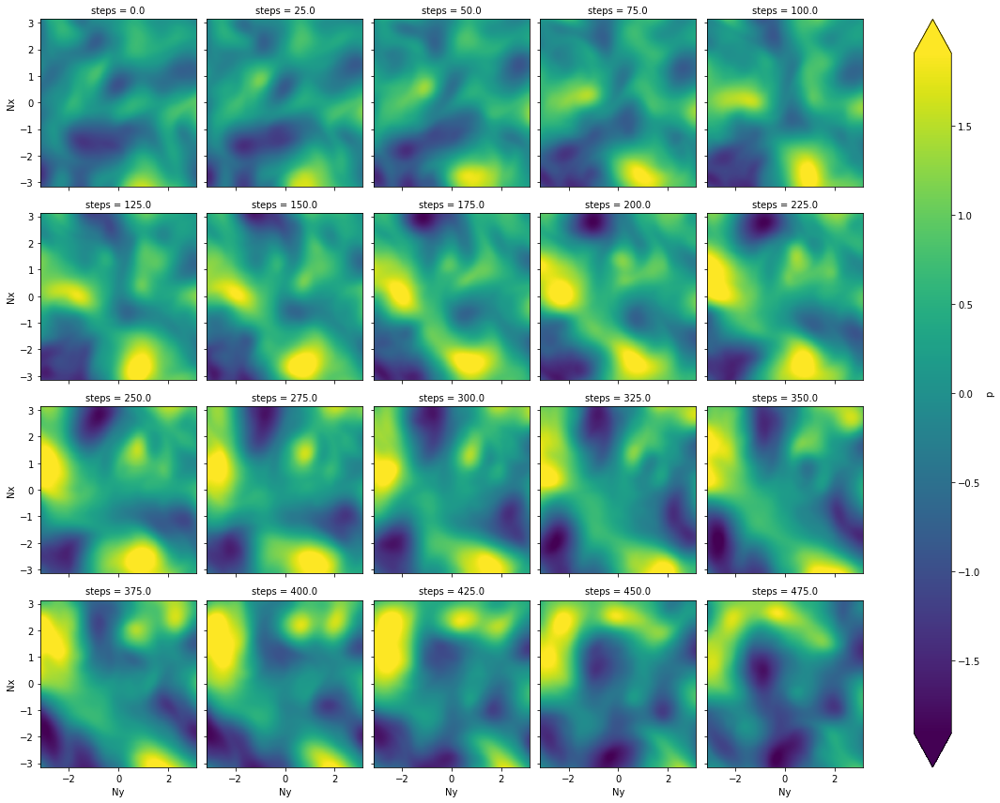

In [158]:
ds_grid_ext.p.thin(steps=25).plot.imshow(
    col="steps", robust=True, col_wrap=5, cmap="viridis",
)


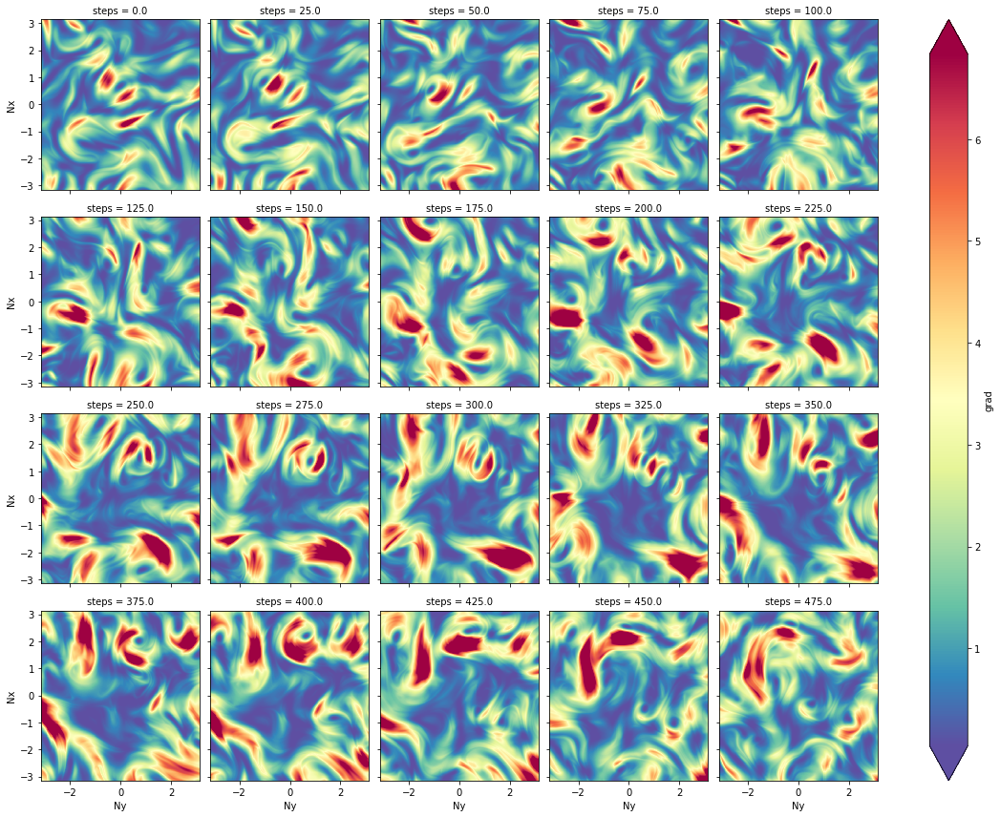

In [159]:
def gradient_norm(ds):
    return (
        ds.differentiate(coord="Nx", edge_order=1)**2 + 
        ds.differentiate(coord="Ny", edge_order=1)**2
    ).rename("grad")

ds_grid_ext.p.pipe(gradient_norm).thin(steps=25).plot.imshow(
    col="steps", robust=True, col_wrap=5, cmap="Spectral_r",
)

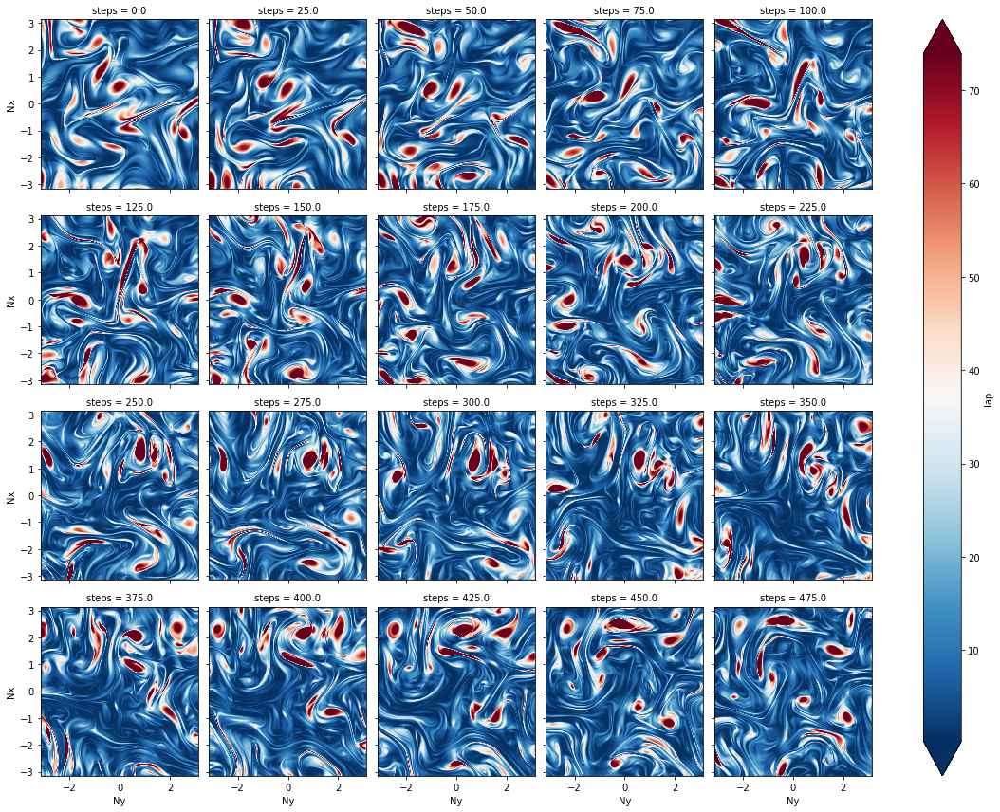

In [160]:
def laplacian_norm(ds):
    return (
        ds.differentiate(coord="Nx", edge_order=1).differentiate(coord="Nx", edge_order=1)**2 + 
        ds.differentiate(coord="Ny", edge_order=1).differentiate(coord="Ny", edge_order=1)**2
    ).rename("lap")

ds_grid_ext.p.pipe(laplacian_norm).thin(steps=25).plot.imshow(
    col="steps", robust=True, col_wrap=5, cmap="RdBu_r"
)


In [161]:
# ds_grid_ext.p_obs.hvplot.image(x="Nx", y="Ny", width=500, height=400, cmap="RdBu_r")
# 

In [162]:
psd_coords = ["Nx", "steps", "Ny"]
# psd_coords = ["Ny", "steps", "Nx"]

ds_psd_ext = compute_psd(ds_grid_ext.p, ds_grid_ext.p_obs, psd_coords)

[                                        ] | 0% Completed |  0.5s

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(
/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


[########################################] | 100% Completed |  3.7s
[########################################] | 100% Completed |  3.1s


In [163]:
ds_psd_ext.coords[f"freq_{psd_coords[-2]}"] = 1./ ds_psd_ext[f"freq_{psd_coords[-2]}"]
ds_psd_ext.coords[f"freq_{psd_coords[-1]}"] = 1./ds_psd_ext[f"freq_{psd_coords[-1]}"]



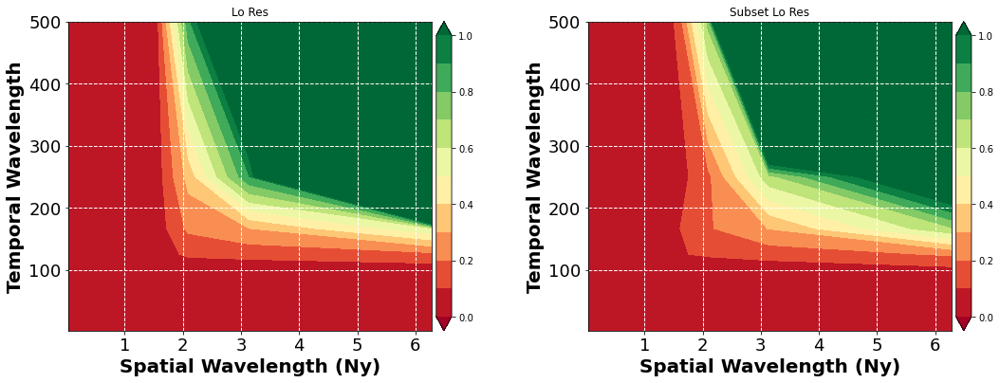

In [164]:
fig, ax = plt.subplots(figsize=(18, 6), ncols=2)

c1 = ax[0].contourf(
    ds_psd[f"freq_{psd_coords[-1]}"],
    ds_psd[f"freq_{psd_coords[-2]}"],
    ds_psd.psd_signal,
    levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, ax=ax[0], pad=0.01)
ax[0].set_xlabel(f'Spatial Wavelength ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax[0].set_ylabel('Temporal Wavelength', fontweight='bold', fontsize=20)
ax[0].grid(linestyle='--', lw=1, color='w')
ax[0].tick_params(axis='both', which='major', labelsize=18)
ax[0].set_title("Lo Res")

c1 = ax[1].contourf(
    ds_psd_ext[f"freq_{psd_coords[-1]}"],
    ds_psd_ext[f"freq_{psd_coords[-2]}"],
    ds_psd_ext.psd_signal,
    levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, ax=ax[1], pad=0.01)
ax[1].set_xlabel(f'Spatial Wavelength ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax[1].set_ylabel('Temporal Wavelength', fontweight='bold', fontsize=20)
ax[1].grid(linestyle='--', lw=1, color='w')
ax[1].tick_params(axis='both', which='major', labelsize=18)
ax[1].set_title("Subset Lo Res")

plt.show()

In [165]:
# ds_test = xr.open_dataset("https://github.com/adekunleoajayi/powerspec/raw/9f9ea5b1044fca2591c33f53838fee097e53e023/data/eNATL60SBOX-BLBT02_y2010m03d01.1h_vozocrtx_lev0.nc")

In [89]:


# # - get data
# ds_path = '/Users/eman/code_projects/2022b_qg_mapping/data/eNATL60SBOX-BLBT02_y2010m03d01.1h_vozocrtx_lev0.nc'
# ds_test = xr.open_dataset(ds_path)
# ds_test



<xarray.Dataset>
Dimensions:              (depthu: 1, axis_nbounds: 2, y: 398, x: 298,
                          time_counter: 24)
Coordinates:
  * depthu               (depthu) float32 0.4805
    nav_lat              (y, x) float32 ...
    nav_lon              (y, x) float32 ...
    time_centered        (time_counter) datetime64[ns] ...
  * time_counter         (time_counter) datetime64[ns] 2010-03-01T00:30:00 .....
Dimensions without coordinates: axis_nbounds, y, x
Data variables:
    depthu_bounds        (depthu, axis_nbounds) float32 ...
    time_counter_bounds  (time_counter, axis_nbounds) datetime64[ns] ...
    vozocrtx             (time_counter, depthu, y, x) float32 ...
Attributes: (12/14)
    name:         /scratch/tmp/5330499/eNATL60-BLBT02X_1h_20100220_20100316_g...
    description:  ocean U grid variables
    title:        ocean U grid variables
    Conventions:  CF-1.6
    timeStamp:    2019-Apr-03 05:55:55 GMT
    uuid:         0bff26d2-426e-492d-81f5-d8c6cfcefc60
    ...           ...
    jbegin:       0
    nj:           10
    file_name:    eNATL60-BLBT02X_1h_20100220_20100316_gridU_20100301-2010030...
    TimeStamp:    04/04/2019 04:29:10 +0200
    history:      Tue Apr 21 15:41:04 2020: ncks -O -F -d x,3479,3776 -d y,22...
    NCO:          4.4.6

In [98]:
ds_test.vozocrtx

<xarray.DataArray 'vozocrtx' (time_counter: 24, depthu: 1, y: 398, x: 298)>
[2846496 values with dtype=float32]
Coordinates:
  * depthu         (depthu) float32 0.4805
    nav_lat        (y, x) float32 ...
    nav_lon        (y, x) float32 ...
    time_centered  (time_counter) datetime64[ns] 2010-03-01T00:30:00 ... 2010...
  * time_counter   (time_counter) datetime64[ns] 2010-03-01T00:30:00 ... 2010...
Dimensions without coordinates: y, x
Attributes:
    standard_name:       sea_water_x_velocity
    long_name:           ocean current along i-axis
    units:               m/s
    online_operation:    average
    interval_operation:  40 s
    interval_write:      1 h
    cell_methods:        time: mean (interval: 40 s)

In [107]:
data

<xarray.DataArray 'vozocrtx' (time_counter: 24, y: 398, x: 298)>
[2846496 values with dtype=float32]
Coordinates:
    depthu         float32 0.4805
    nav_lat        (y, x) float32 ...
    nav_lon        (y, x) float32 ...
    time_centered  (time_counter) datetime64[ns] 2010-03-01T00:30:00 ... 2010...
  * time_counter   (time_counter) datetime64[ns] 2010-03-01T00:30:00 ... 2010...
Dimensions without coordinates: y, x
Attributes:
    standard_name:       sea_water_x_velocity
    long_name:           ocean current along i-axis
    units:               m/s
    online_operation:    average
    interval_operation:  40 s
    interval_write:      1 h
    cell_methods:        time: mean (interval: 40 s)

In [106]:
with ProgressBar():
    
    data = ds_test.isel(depthu=0).vozocrtx

    data = data.chunk({'time_counter':100 , "nav_lon": data.nav_lon.size, "nav_lat": data.nav_lat.size})
    
    u = xrft.isotropic_power_spectrum(
        data,
        dim=["nav_lon", "nav_lat"], detrend='linear', window=True
    ).compute()
    
    # v = xrft.isotropic_power_spectrum(
    #     data.v,
    #     dim=["nav_lon", "nav_lat"], detrend='linear', window=True
    # ).compute()
    
    # ekeiso_ext = 0.5 * (u**2 + v**2)

ValueError: some chunks keys are not dimensions on this object: {'nav_lat', 'nav_lon'}

In [115]:
ds_test.vozocrtx

<xarray.DataArray 'vozocrtx' (time_counter: 24, depthu: 1, y: 398, x: 298)>
[2846496 values with dtype=float32]
Coordinates:
  * depthu         (depthu) float32 0.4805
    nav_lat        (y, x) float32 39.95 39.95 39.95 39.95 ... 45.0 45.0 45.0
    nav_lon        (y, x) float32 -39.99 -39.97 -39.95 ... -35.12 -35.1 -35.08
    time_centered  (time_counter) datetime64[ns] 2010-03-01T00:30:00 ... 2010...
  * time_counter   (time_counter) datetime64[ns] 2010-03-01T00:30:00 ... 2010...
Dimensions without coordinates: y, x
Attributes:
    standard_name:       sea_water_x_velocity
    long_name:           ocean current along i-axis
    units:               m/s
    online_operation:    average
    interval_operation:  40 s
    interval_write:      1 h
    cell_methods:        time: mean (interval: 40 s)

In [137]:
from tqdm.notebook import trange

# - compute hourly spectral then estimate the mean
_psd = [] 
for k in trange(len(ds_test.vozocrtx)):
    wavenumber,psd_ = ps.wavenumber_spectra(
        ds_test.vozocrtx[k].to_masked_array().squeeze(),
        ds_test.vozocrtx.nav_lon + 100,
        ds_test.vozocrtx.nav_lat + 100
    )
    _psd.append(psd_) 
psd = np.array(_psd).mean(axis=0)

  0%|          | 0/24 [00:00<?, ?it/s]

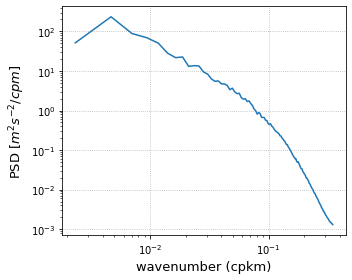

In [138]:
plt.figure(figsize=(5,4))
plt.loglog(wavenumber*1E3,psd)
plt.xlabel('wavenumber (cpkm)',fontsize=13)
plt.ylabel('PSD '+r'[$m^{2}s^{-2}/cpm$]',fontsize=13)
plt.grid(ls='dotted')
plt.tight_layout()

### PowerSpec

In [175]:
from tqdm.notebook import trange

NX, NY = np.meshgrid(ds_grid_ext.p.Nx, ds_grid_ext.p.Ny)
data = ds_grid_ext.p

# - compute hourly spectral then estimate the mean
_psd = [] 
for k in trange(len(data)):
    wavenumber, ipsd = ps.wavenumber_spectra(
        data[k].to_masked_array().squeeze(),
        NX,
        NY
    )
    _psd.append(ipsd) 
    
psd_powerspec_res["psd_full"] = np.array(_psd)
psd_powerspec_res["wavenumber_full"] = wavenumber

  0%|          | 0/500 [00:00<?, ?it/s]

In [176]:
psd_powerspec_res["psd_full_mean"] = psd_powerspec_res["psd_full"].mean(0)

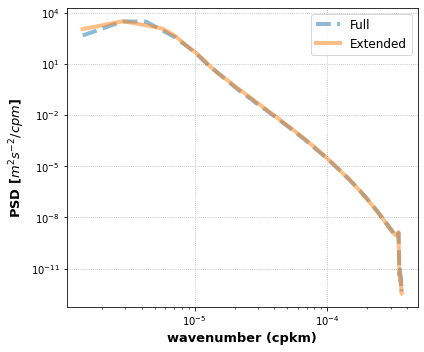

In [192]:
fig, ax = plt.subplots(figsize=(6,5))
ax.loglog(
    psd_powerspec_res["wavenumber_full"],#1E3,
    psd_powerspec_res["psd_full_mean"],
    label="Full", linewidth=4, linestyle="--", alpha=0.5
)
ax.loglog(
    psd_powerspec_res["wavenumber"],#1E3,
    psd_powerspec_res["psd_mean"],
    label="Extended", linewidth=4, alpha=0.5
)
ax.set_xlabel('wavenumber (cpkm)',fontsize=13, fontweight="bold")
ax.set_ylabel('PSD '+r'[$m^{2}s^{-2}/cpm$]',fontsize=13, fontweight="bold")

plt.legend(fontsize=12)
plt.grid(ls='dotted')
plt.tight_layout()
plt.show()

In [51]:
with ProgressBar():
    
    data = ds_grid_ext.rename({"steps":"time"})
    
    data = data.chunk({'time':100 , "Nx": ds_grid.Nx.size, "Ny": ds_grid.Ny.size})
    
    u = xrft.isotropic_power_spectrum(
        data.u,
        dim=["Nx", "Ny"], detrend='linear', window=True
    ).compute()
    
    v = xrft.isotropic_power_spectrum(
        data.v,
        dim=["Nx", "Ny"], detrend='linear', window=True
    ).compute()
    
    ekeiso_ext = 0.5 * (u**2 + v**2)

[                                        ] | 0% Completed |  0.0s

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(
/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:1025: FutureWarning: Isotropic wavenumber larger than the Nyquist wavenumber may result.
  warnings.warn(msg, FutureWarning)


[########################################] | 100% Completed | 14.4s
[                                        ] | 2% Completed |  0.1s

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(
/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:1025: FutureWarning: Isotropic wavenumber larger than the Nyquist wavenumber may result.
  warnings.warn(msg, FutureWarning)


[########################################] | 100% Completed | 14.3s


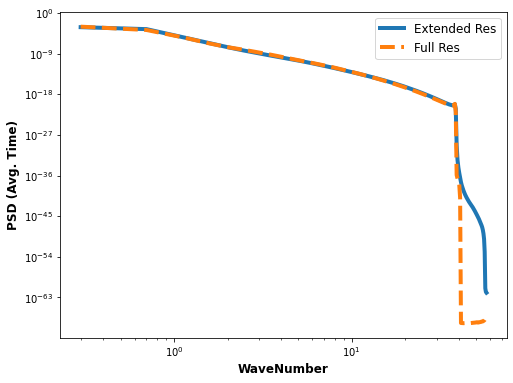

In [80]:
fig, ax = plt.subplots(figsize=(8,6))

ax.plot(
    ekeiso_ext.freq_r, ekeiso_ext.mean("time").values, 
    linewidth=4, label="Extended Res")
ax.plot(
    ekeiso.freq_r, ekeiso.mean("time").values, 
    linewidth=4, linestyle="--", label="Full Res")
ax.set_yscale("log")
ax.set_xscale("log")
plt.legend(fontsize=12)
ax.set_xlabel("WaveNumber", fontsize=12, fontweight="bold")
ax.set_ylabel("PSD (Avg. Time)", fontsize=12, fontweight="bold")
plt.show()

## Dataset - Difference

In [44]:
ds_grid["p_ext"] = (("steps","Nx","Ny"), ds_grid_ext["p"].values)
ds_grid["q_ext"] = (("steps","Nx","Ny"), ds_grid_ext["q"].values)

In [45]:
psd_coords = ["Ny", "steps", "Nx"]

ds_psd_compare = compute_psd(ds_grid.p, ds_grid.p_ext, psd_coords)

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(
/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


[########################################] | 100% Completed |  6.8s
[########################################] | 100% Completed |  7.1s


In [46]:
ds_psd_compare.coords[f"freq_{psd_coords[-2]}"] = 1./ ds_psd_compare[f"freq_{psd_coords[-2]}"]

ds_psd_compare.coords[f"freq_{psd_coords[-1]}"] = 1./ds_psd_compare[f"freq_{psd_coords[-1]}"]



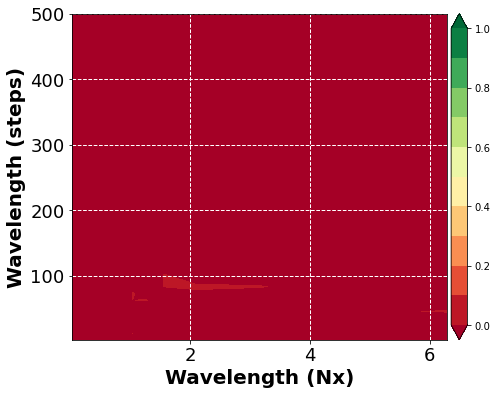

In [47]:
fig, ax = plt.subplots(figsize=(8, 6))

c1 = ax.contourf(
    ds_psd_compare[f"freq_{psd_coords[-1]}"],
    ds_psd_compare[f"freq_{psd_coords[-2]}"],
    ds_psd_compare.psd_score,
    levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, pad=0.01)

ax.set_xlabel(f'Wavelength ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax.set_ylabel(f'Wavelength ({psd_coords[-2]})', fontweight='bold', fontsize=20)
ax.grid(linestyle='--', lw=1, color='w')
ax.tick_params(axis='both', which='major', labelsize=18)

plt.show()

## Dataset - Higher Res

In [38]:
save_path = root.joinpath("data/hi_res.nc")

ds_grid = xr.open_zarr(save_path)

In [41]:
ds_grid

,Array,Chunk
Bytes,3.91 GiB,3.94 MiB
Shape,"(500, 1024, 1024)","(63, 64, 128)"
Count,3201 Tasks,1152 Chunks
Type,float64,numpy.ndarray
,Array,Chunk
Bytes,3.91 GiB,3.94 MiB
Shape,"(500, 1024, 1024)","(63, 64, 128)"
Count,3201 Tasks,1152 Chunks
Type,float64,numpy.ndarray
,Array,Chunk


In [39]:
%%time

ds_grid = preprocessing(ds_grid)

In [42]:
# ds_grid.p_obs.hvplot.image(x="Nx", y="Ny", width=500, height=400, cmap="RdBu_r")

In [44]:
psd_coords = ["Nx", "steps", "Ny"]
# psd_coords = ["Ny", "steps", "Nx"]

ds_psd_hi = compute_psd(ds_grid.p, ds_grid.p_obs, psd_coords)

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


[########################################] | 100% Completed | 15.9s


/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


[########################################] | 100% Completed | 10.1s


In [45]:
ds_psd_hi.coords[f"freq_{psd_coords[-2]}"] = 1./ ds_psd_hi[f"freq_{psd_coords[-2]}"]
ds_psd_hi.coords[f"freq_{psd_coords[-1]}"] = 1./ds_psd_hi[f"freq_{psd_coords[-1]}"]

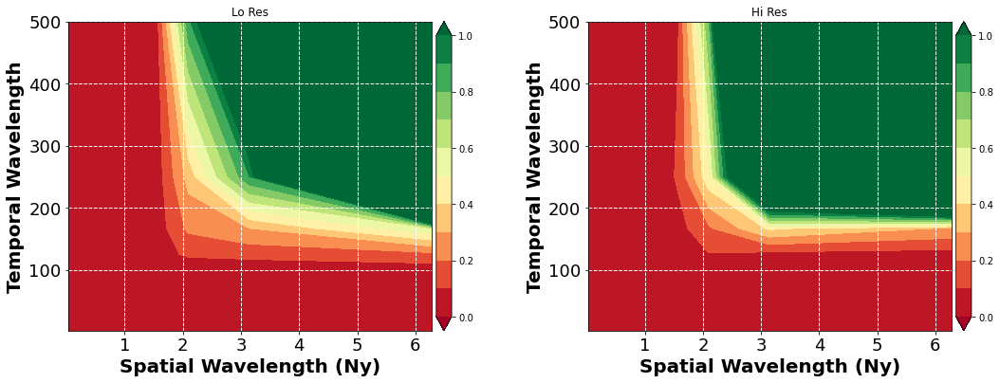

In [65]:
fig, ax = plt.subplots(figsize=(18, 6), ncols=2)

c1 = ax[0].contourf(
    ds_psd[f"freq_{psd_coords[-1]}"],
    ds_psd[f"freq_{psd_coords[-2]}"],
    ds_psd.psd_signal,
    levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, ax=ax[0], pad=0.01)
ax[0].set_xlabel(f'Spatial Wavelength ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax[0].set_ylabel('Temporal Wavelength', fontweight='bold', fontsize=20)
ax[0].grid(linestyle='--', lw=1, color='w')
ax[0].tick_params(axis='both', which='major', labelsize=18)
ax[0].set_title("Lo Res")

c1 = ax[1].contourf(
    ds_psd_hi[f"freq_{psd_coords[-1]}"],
    ds_psd_hi[f"freq_{psd_coords[-2]}"],
    ds_psd_hi.psd_signal,
    levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, ax=ax[1], pad=0.01)
ax[1].set_xlabel(f'Spatial Wavelength ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax[1].set_ylabel('Temporal Wavelength', fontweight='bold', fontsize=20)
ax[1].grid(linestyle='--', lw=1, color='w')
ax[1].tick_params(axis='both', which='major', labelsize=18)
ax[1].set_title("Hi Res")

plt.show()